In [40]:
directory_path = "e3"

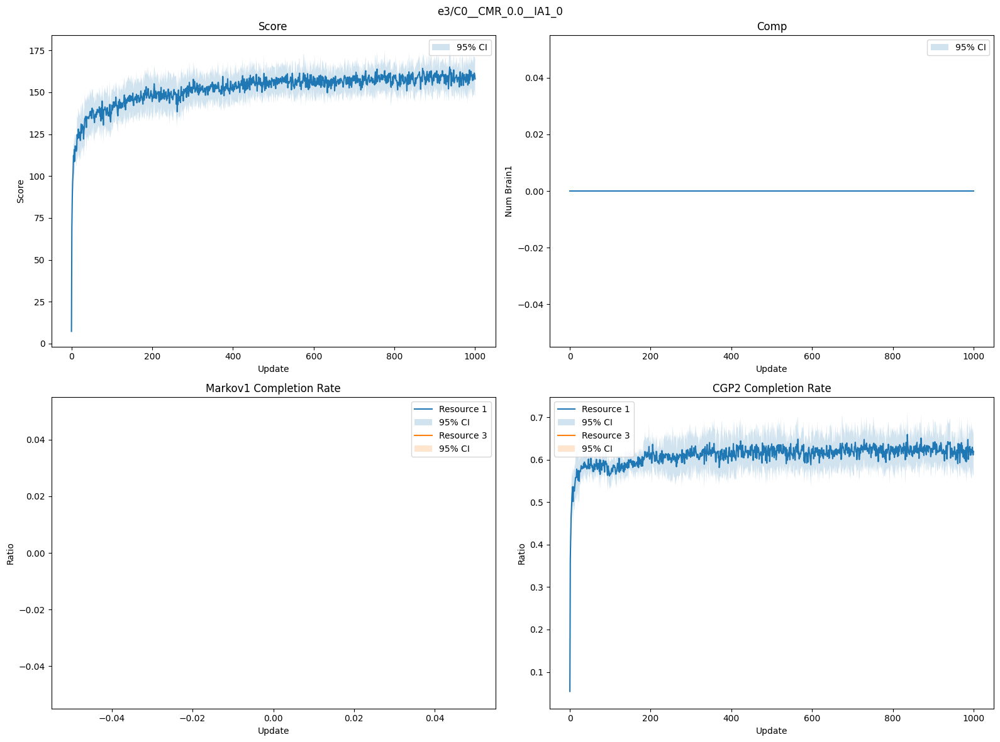

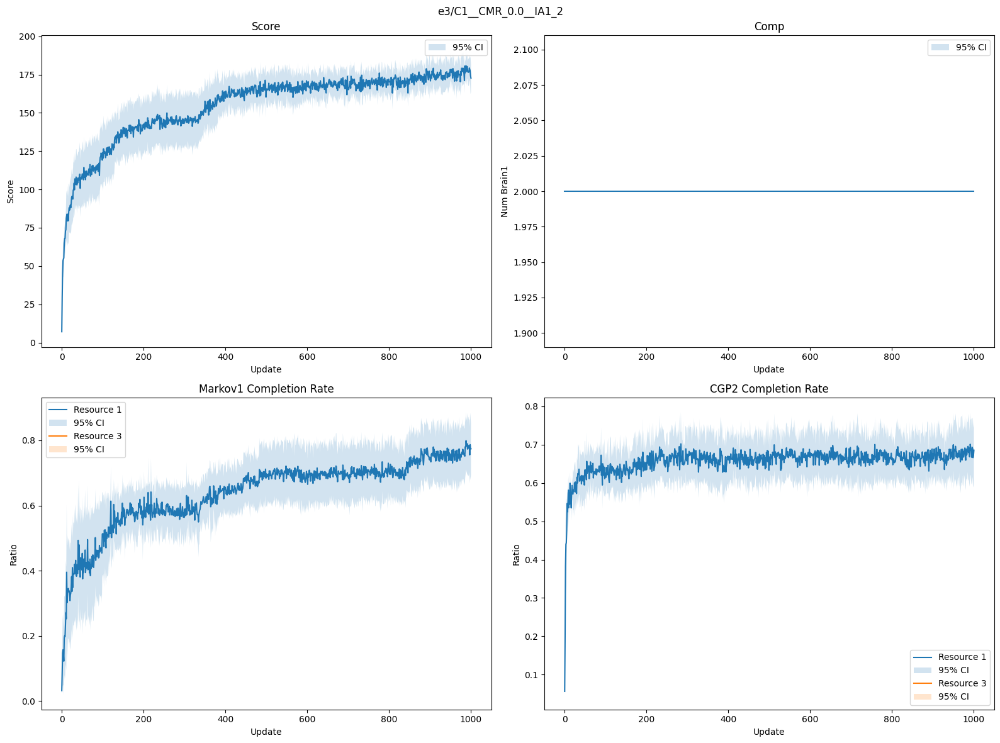

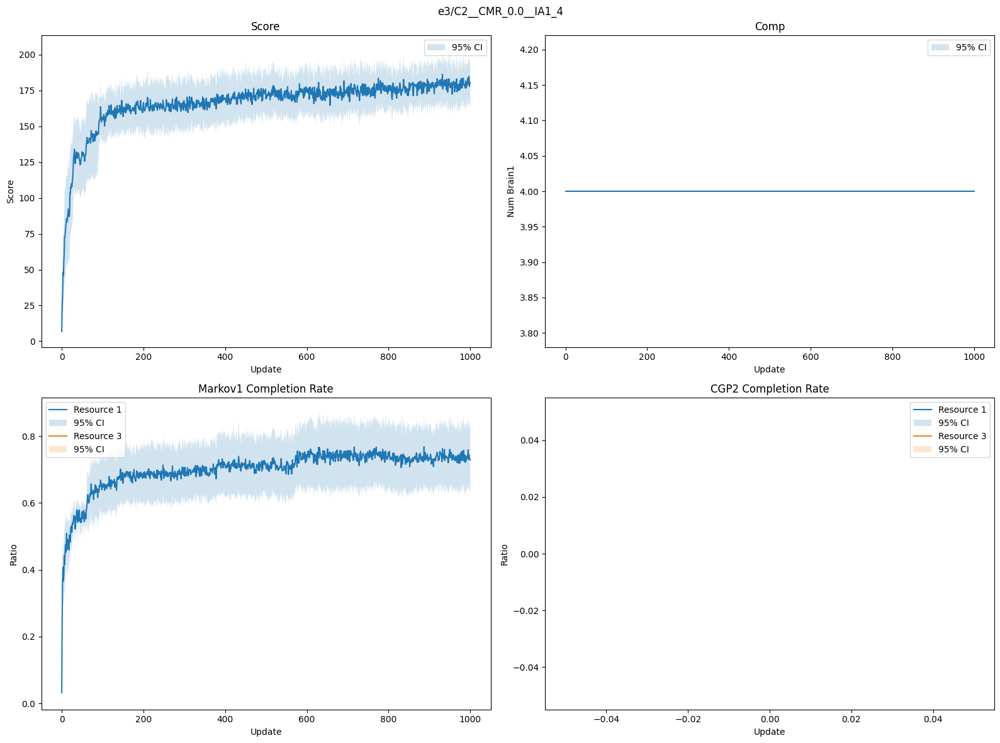

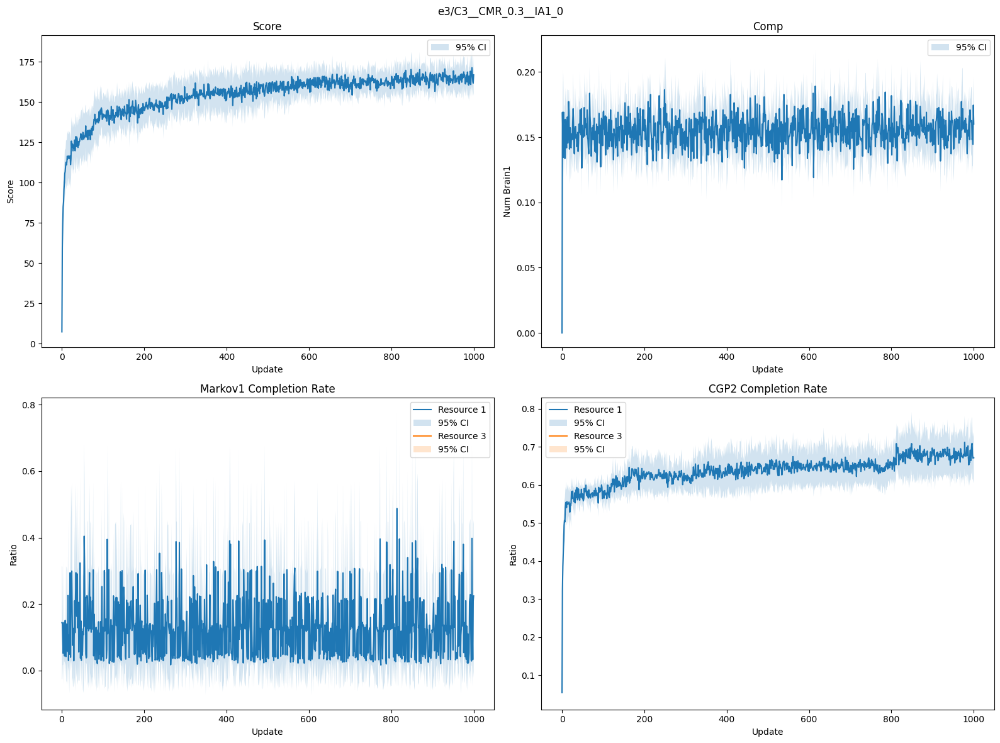

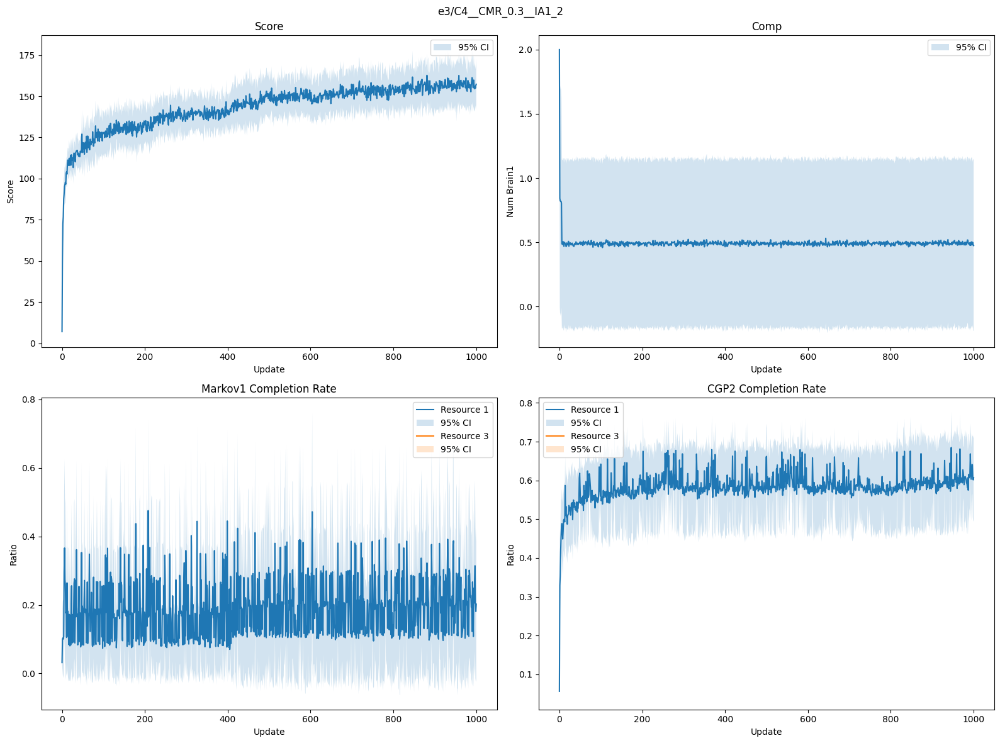

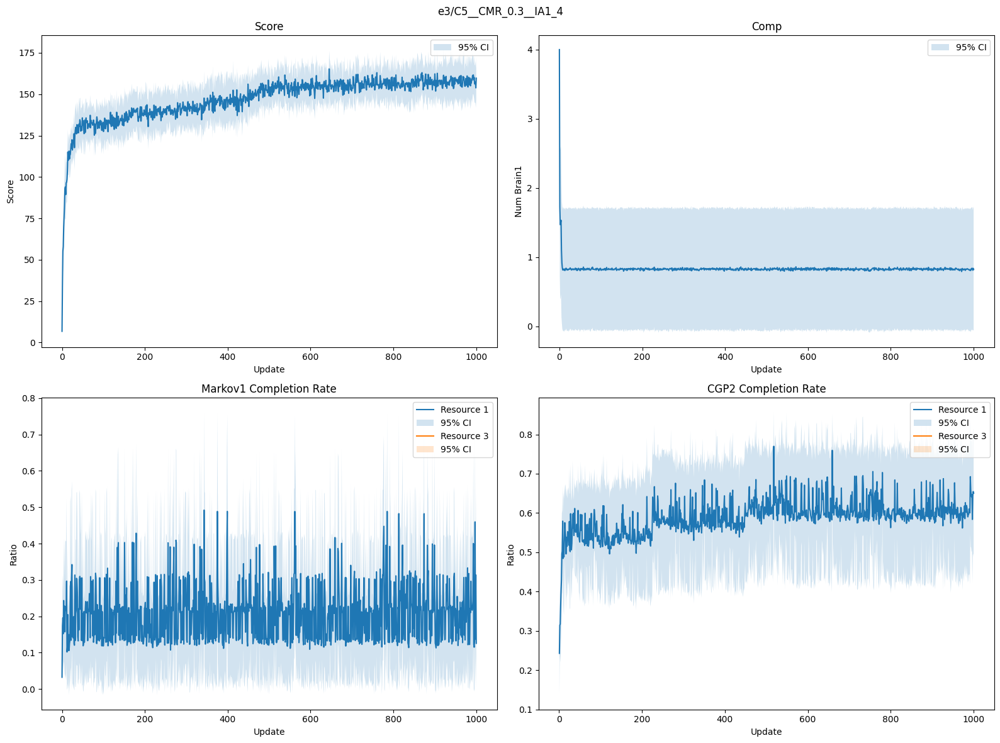

In [41]:
#good luck 
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
import seaborn as sns

def helper(col):
    brain = col[:re.search(r'\D+', col).end()]
    brainID = col[re.search(r'\d', col).start()]
    match = match = re.search(r'\D*\d\D*(\d)', col)
    if match:
        resourceID = match.group(1)
    return brain, brainID, resourceID

def agg(frames, col):
    concatenated_scores = pd.concat([df[col] for df in frames], axis=1)
    mean_scores = concatenated_scores.mean(axis=1)
    sem_scores = concatenated_scores.sem(axis=1)
    ci_lower = mean_scores - 1.96 * sem_scores  
    ci_upper = mean_scores + 1.96 * sem_scores
    return mean_scores, ci_lower, ci_upper
    
# Function to plot select columns from a CSV file
def plot_reps(sub_dir):
    
    dfs = []
    for dirpath, dirnames, filenames in os.walk(sub_dir):
        if "pop.csv" in filenames and "/001" not in dirpath:
            file_path = os.path.join(dirpath, "pop.csv")
            df = pd.read_csv(file_path)
            dfs.append(df)
    
    fig, axs = plt.subplots(2, 2, figsize=(16, 12))
    updates = len(dfs[0])
    means, ci_lower, ci_upper = agg(dfs, "score_AVE")
    
    axs[0, 0].plot(np.arange(0, updates), means)
    axs[0, 0].fill_between(np.arange(0, updates), ci_lower, ci_upper, alpha=0.2, label='95% CI')
    #comp
    means, ci_lower, ci_upper = agg(dfs, "brain1Num_AVE")
    axs[0, 1].plot(np.arange(0, updates), means)
    axs[0, 1].fill_between(np.arange(0, updates), ci_lower, ci_upper, alpha=0.2, label='95% CI')

    for col_name in df.keys():
        if "Attempted" in col_name:
            brain, brainID, resourceID = helper(col_name)
            for df in dfs:
                df[f"{brain}{brainID}_Resource{resourceID}_Ratio"] = df[f"{brain}{brainID}_Resource{resourceID}_Completed_AVE"]/df[f"{brain}{brainID}_Resource{resourceID}_Attempted_AVE"]
            means, ci_lower, ci_upper = agg(dfs, f"{brain}{brainID}_Resource{resourceID}_Ratio")
            axs[1, int(brainID)-1].plot(np.arange(0, updates), means, label=f"Resource {resourceID}")
            axs[1, int(brainID)-1].fill_between(np.arange(0, updates), ci_lower, ci_upper, alpha=0.2, label='95% CI')
            axs[1, int(brainID)-1].set_title(f"{brain}{brainID} Completion Rate")
            axs[1, int(brainID)-1].set_xlabel('Update')
            axs[1, int(brainID)-1].set_ylabel('Ratio')
            

    axs[0, 0].set_title('Score')
    axs[0, 0].set_xlabel('Update')
    axs[0, 0].set_ylabel('Score')
    axs[0, 0].legend()

    axs[0, 1].set_title('Comp')
    axs[0, 1].set_xlabel('Update')
    axs[0, 1].set_ylabel('Num Brain1')
    axs[0, 1].legend()
    axs[1, 0].legend()
    axs[1, 1].legend()

    fig.suptitle(sub_dir)
    plt.tight_layout()
    plt.show()


subdirectories = [os.path.join(directory_path, d) for d in os.listdir(directory_path) if os.path.isdir(os.path.join(directory_path, d))]
for replicate in subdirectories:
    plot_reps(replicate)


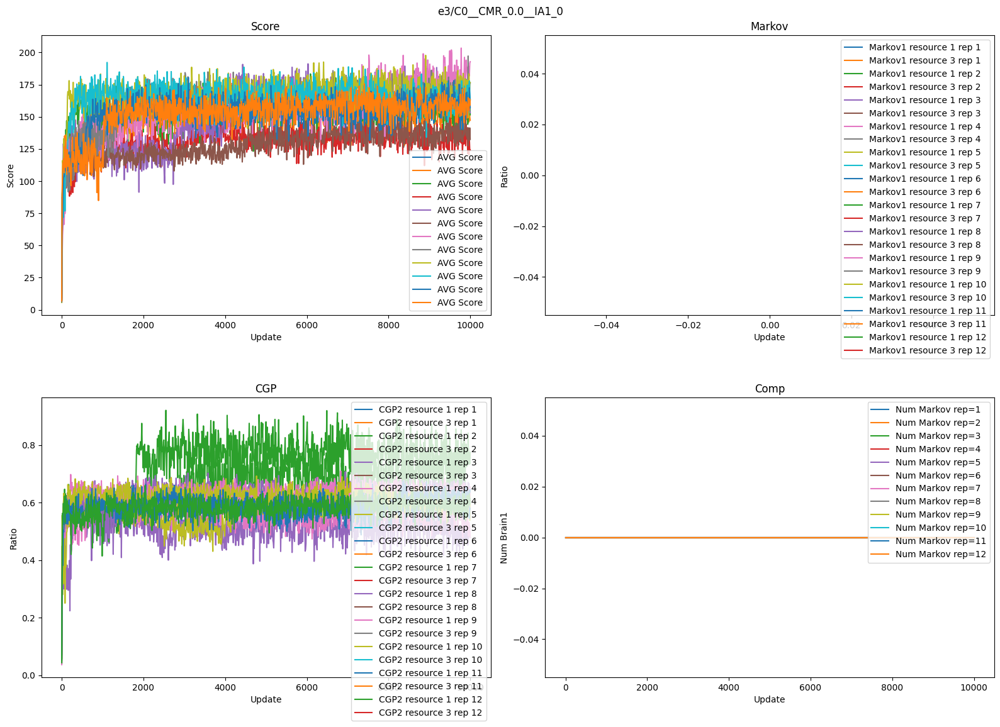

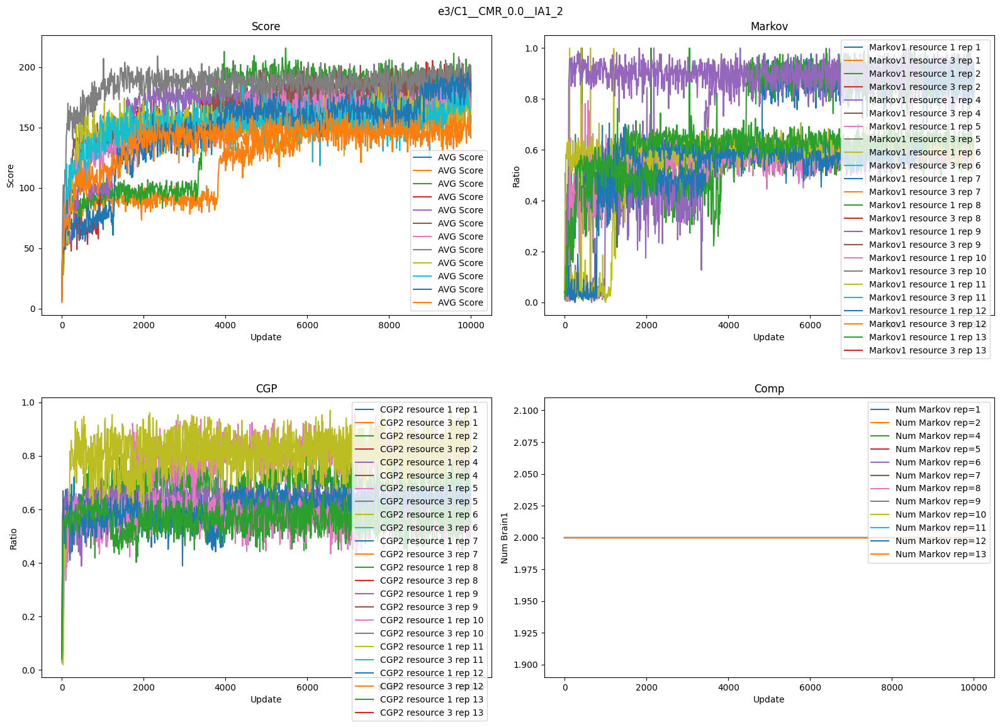

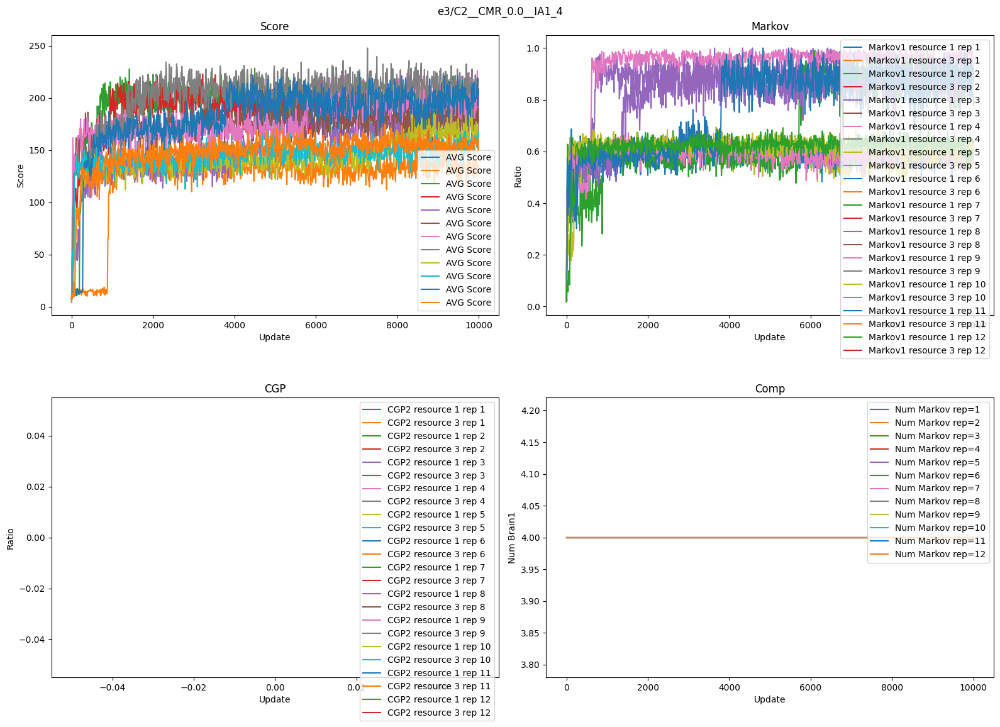

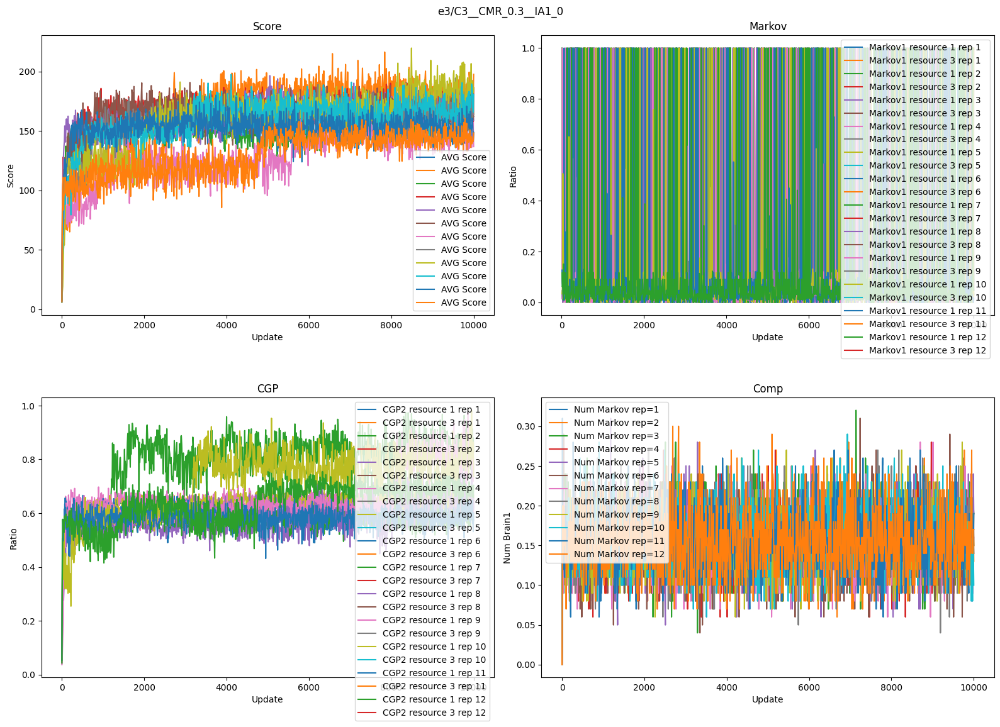

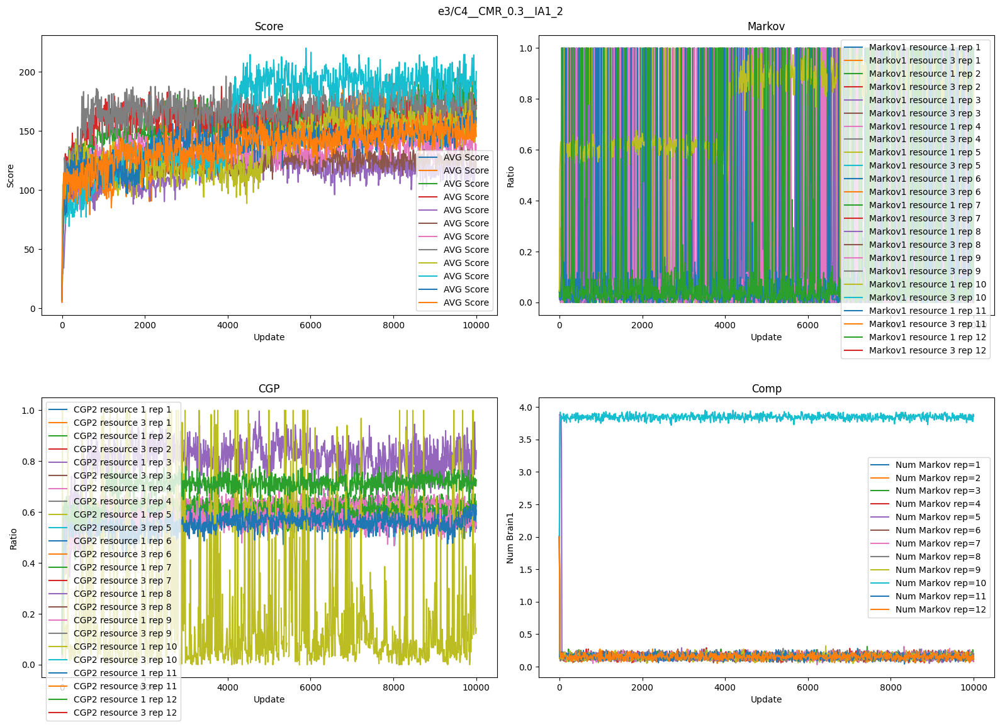

KeyboardInterrupt: 

In [36]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import re
import seaborn as sns

def helper(col):
    brain = col[:re.search(r'\D+', col).end()]
    brainID = col[re.search(r'\d', col).start()]
    match = match = re.search(r'\D*\d\D*(\d)', col)
    if match:
        resourceID = match.group(1)
    return brain, brainID, resourceID

# Function to plot select columns from a CSV file
def plot_reps(sub_dir):
    # Read CSV file into a DataFrame
    fig, axs = plt.subplots(2, 2, figsize=(16, 12))
    rep_number = 0
    for dirpath, dirnames, filenames in os.walk(sub_dir):
        if "pop.csv" in filenames:
            file_path = os.path.join(dirpath, "pop.csv")
            df = pd.read_csv(file_path)

            #score
            #axs[0, 0].plot(df['update'], df["score_AVE"], label=f'AVG Score rep{rep_number}') 
            sns.lineplot(data=df, x='update', y="score_AVE", ax=axs[0, 0], errorbar='sd', label='AVG Score')

        
            #comp
            axs[1, 1].plot(df['update'], df["brain1Num_AVE"], label=f'Num Markov rep={rep_number}')
        
            t = 0
            for col_name in df.keys():
                if "Attempted" in col_name:
                    brain, brainID, resourceID = helper(col_name)
                    first, second = (0, 1) if t > 1 else (1, 0)
                    axs[first, second].plot(df['update'], df[f"{brain}{brainID}_Resource{resourceID}_Completed_AVE"]/df[f"{brain}{brainID}_Resource{resourceID}_Attempted_AVE"], 
                                            label=f'{brain}{brainID} resource {resourceID} rep {rep_number}')
                    axs[first, second].set_title(brain)
                    axs[first, second].set_xlabel('Update')
                    axs[first, second].set_ylabel('Ratio')
                    axs[first, second].legend()
                    t += 1
        rep_number += 1

    axs[0, 0].set_title('Score')
    axs[0, 0].set_xlabel('Update')
    axs[0, 0].set_ylabel('Score')
    axs[0, 0].legend()

    axs[1, 1].set_title('Comp')
    axs[1, 1].set_xlabel('Update')
    axs[1, 1].set_ylabel('Num Brain1')
    axs[1, 1].legend()

    fig.suptitle(sub_dir)
    plt.tight_layout()
    plt.show()


subdirectories = [os.path.join(directory_path, d) for d in os.listdir(directory_path) if os.path.isdir(os.path.join(directory_path, d))]
for replicate in subdirectories:
    plot_reps(replicate)


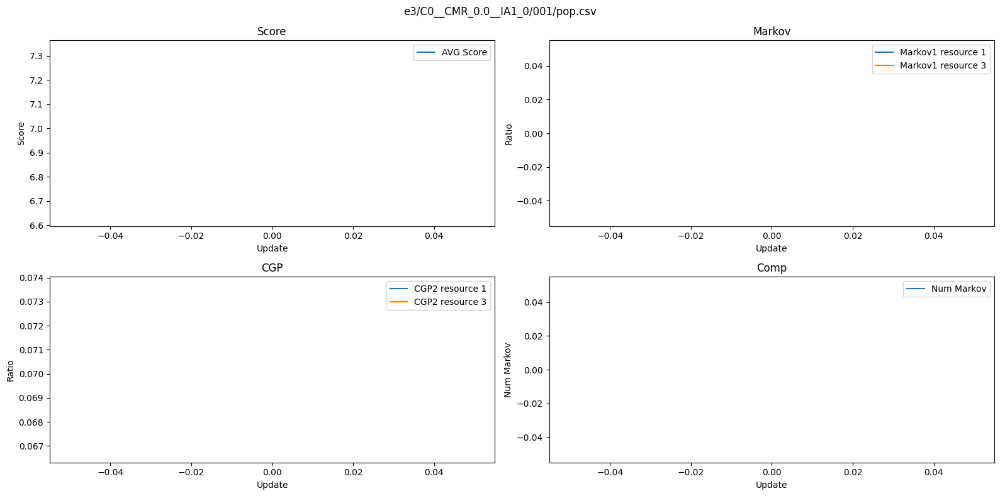

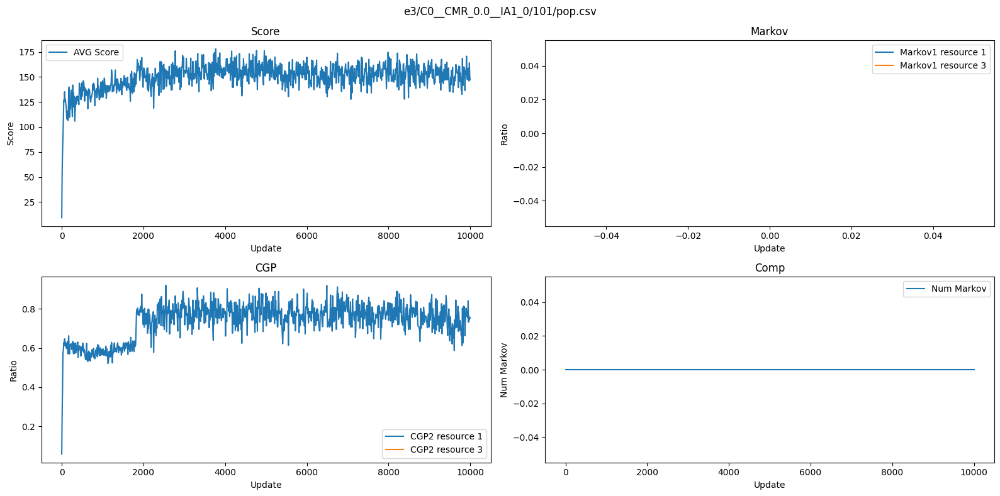

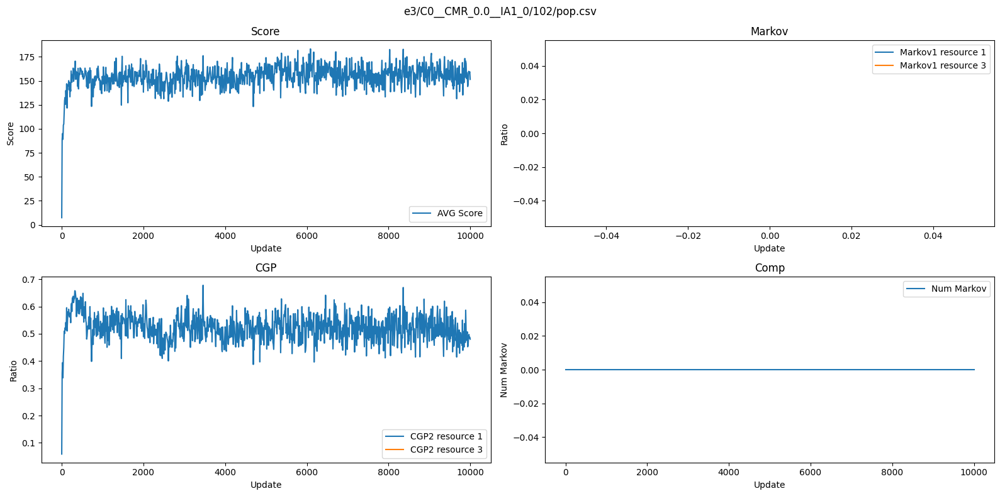

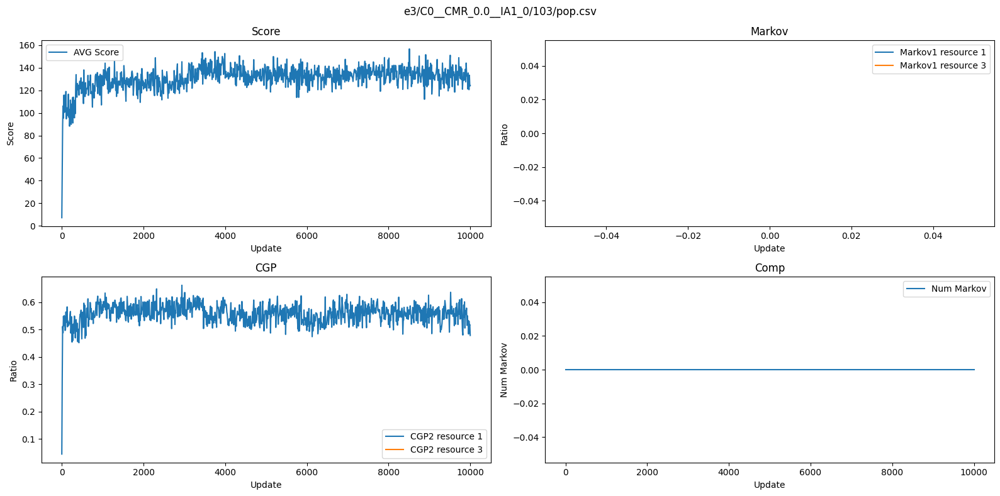

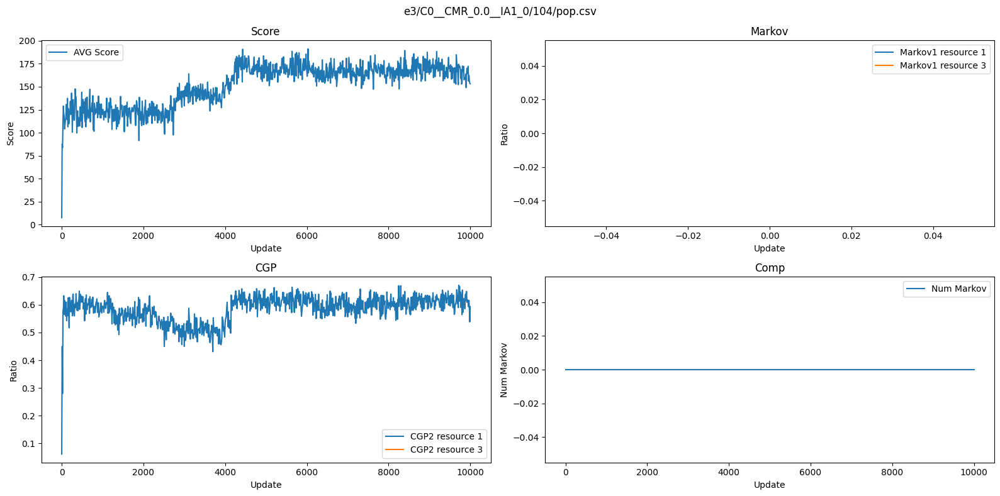

...

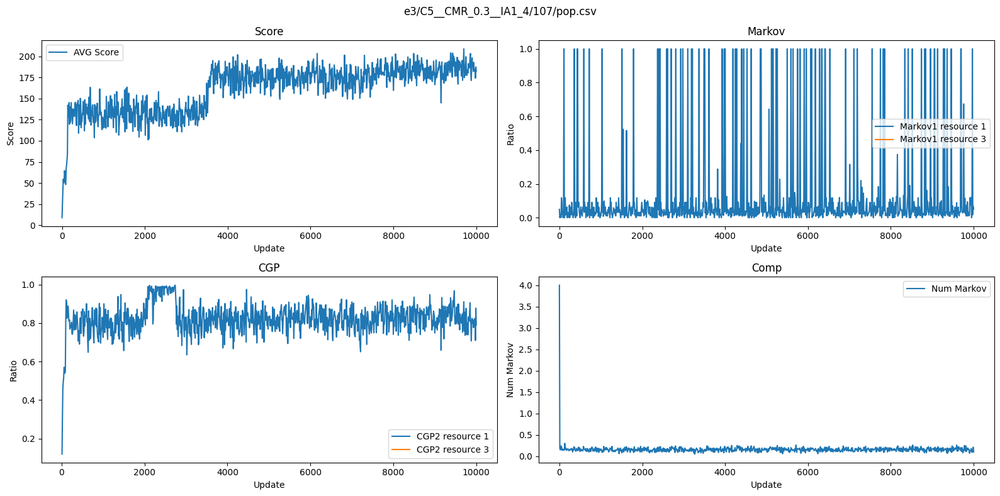

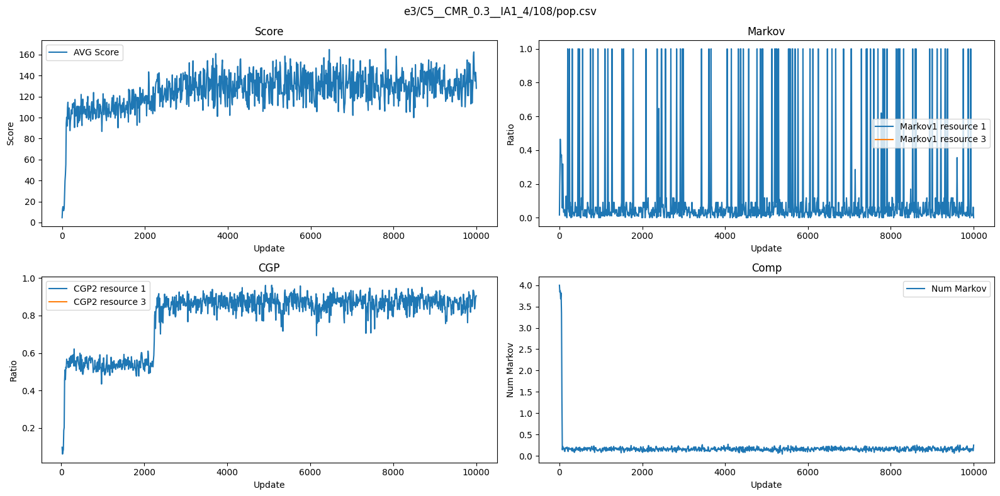

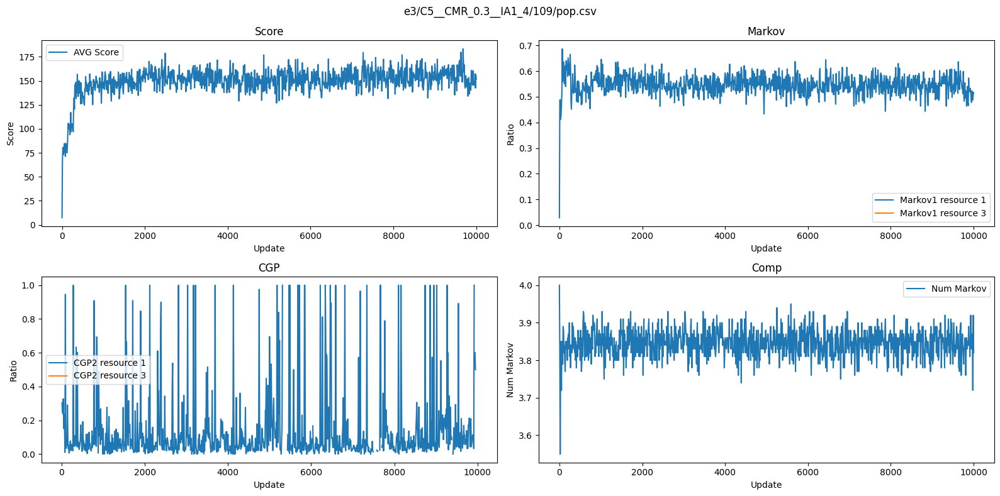

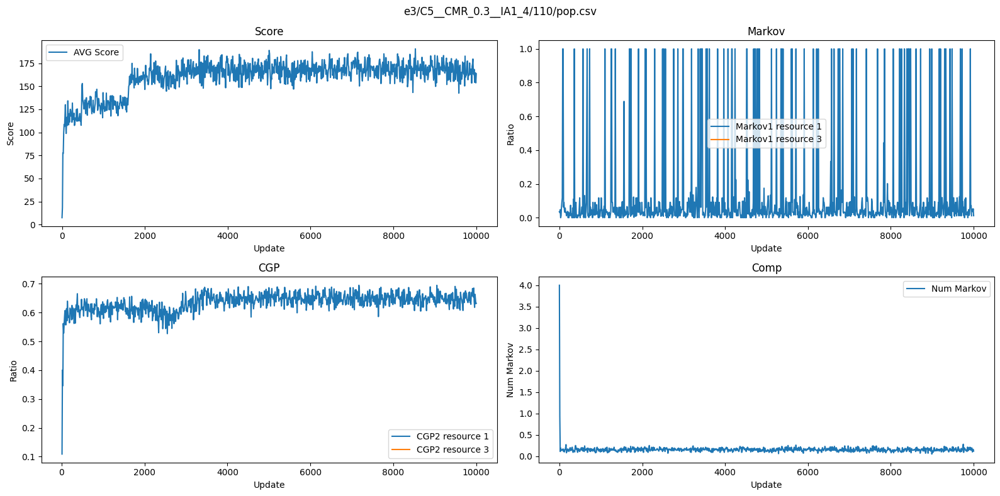

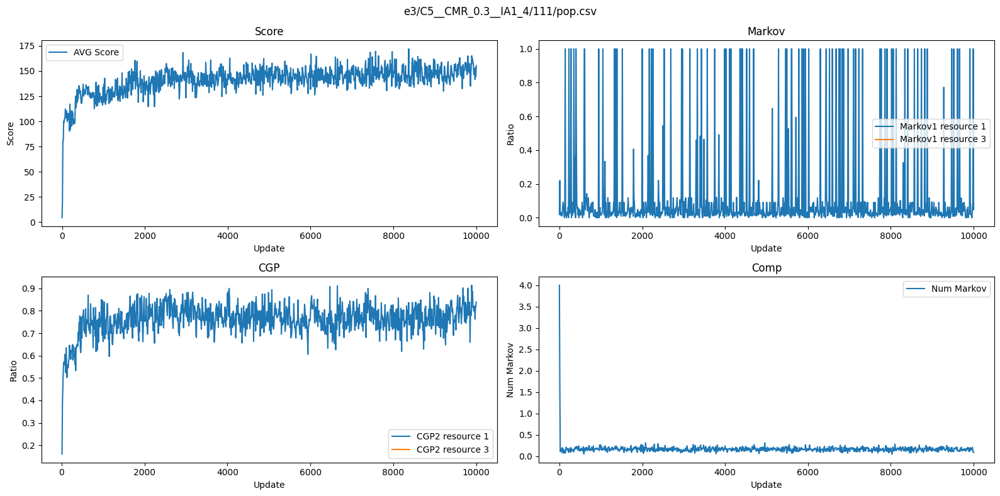

In [3]:
#separate plots for all
import os
import pandas as pd
import matplotlib.pyplot as plt
import re

def helper(col):
    brain = col[:re.search(r'\D+', col).end()]
    brainID = col[re.search(r'\d', col).start()]
    match = match = re.search(r'\D*\d\D*(\d)', col)
    if match:
        resourceID = match.group(1)
    return brain, brainID, resourceID

# Function to plot select columns from a CSV file
def plot_csv_file(csv_file):
    # Read CSV file into a DataFrame
    fig, axs = plt.subplots(2, 2, figsize=(16, 8))
    df = pd.read_csv(csv_file)
    
    #score
    axs[0, 0].plot(df['update'], df["score_AVE"], label='AVG Score') 
    axs[0, 0].set_title('Score')
    axs[0, 0].set_xlabel('Update')
    axs[0, 0].set_ylabel('Score')
    axs[0, 0].legend()

    #comp
    axs[1, 1].plot(df['update'], df["brain1Num_AVE"], label='Num Markov')
    axs[1, 1].set_title('Comp')
    axs[1, 1].set_xlabel('Update')
    axs[1, 1].set_ylabel('Num Markov')
    axs[1, 1].legend()

    t = 0
    for col_name in df.keys():
        if "Attempted" in col_name:
            brain, brainID, resourceID = helper(col_name)
            first, second = (0, 1) if t > 1 else (1, 0)
            axs[first, second].plot(df['update'], df[f"{brain}{brainID}_Resource{resourceID}_Completed_AVE"]/df[f"{brain}{brainID}_Resource{resourceID}_Attempted_AVE"], 
                                    label=f'{brain}{brainID} resource {resourceID}')
            axs[first, second].set_title(brain)
            axs[first, second].set_xlabel('Update')
            axs[first, second].set_ylabel('Ratio')
            axs[first, second].legend()
            t += 1

    fig.suptitle(csv_file)
    plt.tight_layout()
    plt.show()

# Iterate over subdirectories and plot CSV files within them
for root, dirs, files in os.walk(directory_path):
    for file in files:
        if file == 'pop.csv':
            csv_file_path = os.path.join(root, file)
            plot_csv_file(csv_file_path)
